# Настройки

In [ ]:
import pandas as pd
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split
import torch

In [ ]:
device = torch.device('cuda:7' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/extracted_folder/meta_data.csv")


train_val_df, test_df = train_test_split(df, test_size=0.15, random_state=42)

train_df, val_df = train_test_split(train_val_df, test_size=0.1765, random_state=42)

def create_dirs(base_dir='/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented'):
    for split in ['train', 'val', 'test']:
        os.makedirs(os.path.join(base_dir, split), exist_ok=True)
        os.makedirs(os.path.join(base_dir, f'{split}_mask'), exist_ok=True)

create_dirs()

def copy_files(df_split, split, base_dir='/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented'):
    for _, row in df_split.iterrows():
        image_file = row['image']
        mask_file = row['mask']

        src_image = os.path.join(base_dir, 'images', image_file)
        src_mask  = os.path.join(base_dir, 'masks', mask_file)

        dst_image = os.path.join(base_dir, split, image_file)
        dst_mask  = os.path.join(base_dir, f'{split}_mask', mask_file)

        shutil.copy(src_image, dst_image)
        shutil.copy(src_mask, dst_mask)

copy_files(train_df, 'train')
copy_files(val_df, 'val')
copy_files(test_df, 'test')


KeyboardInterrupt: 

In [ ]:
import os

import numpy as np
import numpy.testing as npt

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.models import vgg13, VGG13_Weights

import matplotlib_inline
import matplotlib.pyplot as plt

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [ ]:
class PhotosDataset(Dataset):
    def __init__(self, images_dir, target_dir=None, transforms=None):
        """
        Arguments
        ---------
        images_dir : str
            Путь к директории с изображениями

        target_dir : str
            Путь к директории с масками.
            Каждая маска соответствует изображению.
            Соответствующая маска и изображение имеют схожие имена, но различный формат.

        transforms : some collection
            Последовательность трансформаций для изображений и масок.
        """
        self.transforms = transforms
        self.images_dir = images_dir
        self.target_dir = target_dir
        self.image_filenames = sorted(os.listdir(images_dir))

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        """
        Arguments
        ---------
        idx : int
            Индекс изображения и маски

        Returns
        -------
        (image, mask)
        """
        img_name = self.image_filenames[idx]
        img_path = os.path.join(self.images_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        if self.target_dir:
            # Для файла изображения "855_sat_01.jpg" формируем имя маски "s855_mask_01.jpg"
            base_name = img_name.split('.')[0]      # "855_sat_01"
            mask_name = base_name.replace('sat', 'mask') + '.jpg'
            mask_path = os.path.join(self.target_dir, mask_name)
            mask = Image.open(mask_path).convert("L")

        if self.transforms:
            if self.target_dir:
                transforms_list = self.transforms.transforms
                for transformer in transforms_list:
                    if isinstance(transformer, torchvision.transforms.ToTensor):
                        image = transformer(image)
                        mask = transformer(mask)
                    elif isinstance(transformer, torchvision.transforms.Normalize):
                        image = transformer(image)
                    else:
                        image, mask = transformer(image, mask=mask)
            else:
                image = self.transforms(image)

        if self.target_dir:
            return image, mask
        else:
            return image


In [ ]:
import random
import torchvision.transforms.functional as F

In [ ]:
class RandomHorizontalFlip:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, mask=None):
        if random.random() < self.p:
            image = F.hflip(image)
            if mask:
                mask = F.hflip(mask)
        if mask:
            return image, mask
        else:
            return image

class RandomCrop:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, mask=None):
        if random.random() < self.p:
            width, height = F.get_image_size(image)

            w = int(random.uniform(width * 0.9, width))
            h = int(random.uniform(height * 0.9, height))

            # Выбор случайного положение для обрезания
            i = random.randint(0, height - h)
            j = random.randint(0, width - w)
            zero_mask = np.zeros((height, width))
            zero_mask[i:i+h, j:j+w] = 1

            image_tensor = F.to_tensor(image)
            image_tensor = torch.where(F.to_tensor(zero_mask) == 0, 0, image_tensor)
            image = F.to_pil_image(image_tensor)

            if mask:
                mask_tensor = F.to_tensor(mask)
                mask_tensor = torch.where(F.to_tensor(zero_mask) == 0, 0, mask_tensor)
                mask = F.to_pil_image(mask_tensor)

        if mask:
            return image, mask
        else:
            return image

class RandomBrightness:
    def __init__(self, factor=1.1, p=1):
        self.factor = factor
        self.p = p

    def __call__(self, image, mask=None):
        if random.random() < self.p:
            delta = random.uniform(2 - self.factor, self.factor)
            image = F.adjust_brightness(image, delta)
        if mask:
            return image, mask
        else:
            return image

class RandomBackgroundChange:
    def __init__(self, background_images, p=0.5):
        self.background_images = background_images
        self.p = p

    def __call__(self, image, mask=None):
        if mask:
            if random.random() < self.p:
                bg_image = random.choice(self.background_images)
                bg_image_tensor = F.to_tensor(bg_image)
                image_tensor = F.to_tensor(image)
                mask_tensor = F.to_tensor(mask)
                bg_image_tensor = F.resize(bg_image_tensor, image_tensor.shape[-2:])
                mask_tensor = F.resize(mask_tensor, image_tensor.shape[-2:])
                masked_image_tensor = image_tensor * mask_tensor
                inverse_mask_tensor = 1 - mask_tensor
                background_tensor = bg_image_tensor * inverse_mask_tensor
                composite_image_tensor = background_tensor + masked_image_tensor
                composite_image = F.to_pil_image(composite_image_tensor)
                return composite_image, mask
            return image, mask
        else:
            return image


In [ ]:
import os
from PIL import Image
import torchvision

In [ ]:
from torchvision import transforms

bg_img1 = Image.open("/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented/images/855_sat_01.jpg")
bg_img2 = Image.open("/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented/images/855_sat_02.jpg")

random_transforms = transforms.Compose([
    RandomHorizontalFlip(0.2),
    RandomCrop(0),
    RandomBrightness(0.2),
    #RandomBackgroundChange(background_images=[bg_img1, bg_img2]),
    transforms.ToTensor(),
    transforms.Normalize(
      mean=[0.485, 0.456, 0.406],
      std=[0.229, 0.224, 0.225]
    )
])

transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
      mean=[0.485, 0.456, 0.406],
      std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
DATA_PATH = '/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented/'

train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=random_transforms
)


valid_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'val'),
    target_dir=os.path.join(DATA_PATH, 'val_mask'),
    transforms=transforms
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=transforms
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def show_idx_image(dataset, idx):
    image, mask = dataset[idx]

    # Преобразуем изображение из формата (C, H, W) в (H, W, C) и де-нормализуем
    image = image.permute(1, 2, 0).numpy()
    image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image = np.clip(image, 0, 1)

    # Обработка маски: если маска имеет форму (1, H, W) - убираем измерение канала,
    # если (3, H, W) - переставляем оси, чтобы получить (H, W, C)
    if mask.ndim == 3:
        if mask.shape[0] == 1:
            mask = mask.squeeze(0).numpy()
        elif mask.shape[0] == 3:
            mask = mask.permute(1, 2, 0).numpy()
    else:
        mask = mask.numpy()

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(image)
    # Если маска одномерная (градации серого), можно указать cmap
    if mask.ndim == 2:
        axes[1].imshow(mask, cmap='gray')
    else:
        axes[1].imshow(mask)

    axes[0].axis('off')
    axes[1].axis('off')
    fig.tight_layout()
    plt.show()


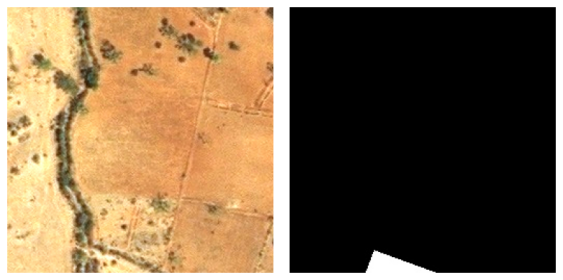

In [ ]:
show_idx_image(train_dataset, 30)

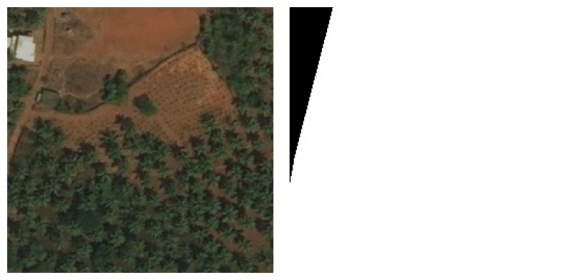

In [ ]:
show_idx_image(train_dataset, 100)

In [ ]:
batch_size_train = 128
valid_data_loader = DataLoader(valid_dataset, batch_size=batch_size_train, num_workers=7)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size_train, num_workers=7)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size_train, num_workers=7, shuffle=False)

DICELOSS

In [ ]:
class DiceLoss(torch.nn.Module):
    def __init__(self, eps=1e-7, reduction=None, with_logits=True):
        """
        Arguments
        ---------
        eps : float
            eps in denominator
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:

            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed.
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()
        self.eps = eps
        self.reduction = reduction
        self.with_logits = with_logits

    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        true_labels = true_labels.to(torch.long)

        if self.with_logits:
            # your code here
            logits = torch.nn.functional.sigmoid(logits)

        # your code here
        intersection = torch.sum(2 * logits * true_labels, dim=(1, 2))
        cardinality_pred = torch.sum(logits, dim=(1, 2))
        cardinality_target = torch.sum(true_labels, dim=(1, 2))
        dice_loss = 1 - intersection / (cardinality_pred + cardinality_target + self.eps)

        if self.reduction == 'sum':
            # your code here
            loss_value = torch.sum(dice_loss)
        elif self.reduction == 'mean':
            # your code here
            loss_value = torch.mean(dice_loss)
        elif self.reduction is None:
            # your code here
            loss_value = dice_loss

        return loss_value

IOU

In [ ]:
class IoUScore(torch.nn.Module):
    def __init__(self, threshold, reduction=None):
        """
        Arguments
        ---------
        threshold : float
            threshold for logits binarization
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:

            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed.
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()

        self.threshold = threshold
        self.reduction = reduction

    @torch.no_grad()
    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        # your code here
        bin_logits = torch.where(logits > self.threshold, 1, 0)
        intersection = torch.sum(torch.logical_and(bin_logits, true_labels).float(), dim=(1, 2))
        union = torch.sum(torch.logical_or(bin_logits, true_labels).float(), dim=(1, 2))
        iou_score = intersection / union

        if self.reduction == 'sum':
            # your code here
            score = iou_score.sum()
        elif self.reduction == 'mean':
            # your code here
            score = iou_score.mean()
        else:
            score = iou_score

        return score

Логирование

In [ ]:
from time import time
import io

device = torch.device('cuda:7' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
def create_figure(image, label, prediction, prediction_bin, epoch):
    import numpy as np
    import matplotlib.pyplot as plt

    # Допустим, вы нормализовали изображения по ImageNet:
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Денормализация входного изображения:
    image_np = image.cpu().permute(1, 2, 0).numpy()  # (H, W, C)
    image_np = image_np * std + mean
    image_np = np.clip(image_np, 0, 1)

    # Преобразование маски. Предполагаем, что маска хранится в одном канале:
    label_np = label.cpu().squeeze().numpy()

    # Если предсказание вероятностной маски имеет размер [1, H, W]
    prediction_np = prediction.cpu().squeeze().numpy()
    prediction_np = np.clip(prediction_np, 0, 1)

    # Бинарное предсказание, обычно уже в виде 0/1
    prediction_bin_np = prediction_bin.cpu().squeeze().numpy()

    # Создаём фигуру с заголовком, который можно использовать для отображения эпохи
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    fig.suptitle(f'Epoch {epoch}', fontsize=16)

    axes[0].imshow(image_np)
    axes[0].set_title('Input Image')
    axes[0].axis('off')

    axes[1].imshow(label_np, cmap='gray')
    axes[1].set_title('True Mask')
    axes[1].axis('off')

    axes[2].imshow(prediction_np, cmap='gray')
    axes[2].set_title('Predicted Probability Mask')
    axes[2].axis('off')

    axes[3].imshow(prediction_bin_np, cmap='gray')
    axes[3].set_title('Predicted Mask')
    axes[3].axis('off')

    plt.tight_layout()
    return fig


@torch.no_grad()
def log_images(tensorboard_writer, images, labels, predictions, predictions_bin, epoch, tag):
    for i, (image, label, prediction, prediction_bin) in enumerate(zip(images, labels, predictions, predictions_bin)):
        fig = create_figure(image, label, prediction, prediction_bin, epoch)
        tensorboard_writer.add_figure(tag + f'/Epoch {epoch}/Pic {i + 1}', fig)
        plt.close(fig)

In [ ]:
fixed_num = 3
fixed_images_train = []
fixed_masks_train = []
fixed_images_test = []
fixed_masks_test = []

for i in range(fixed_num):
    fixed_image_train, fixed_mask_train = train_dataset[i]
    fixed_images_train.append(fixed_image_train)
    fixed_masks_train.append(fixed_mask_train)

    fixed_image_test, fixed_mask_test = test_dataset[i]
    fixed_images_test.append(fixed_image_test)
    fixed_masks_test.append(fixed_mask_test)

In [ ]:
#Логирование распределения весов, активаций и градиентов
@torch.no_grad()
def log_distributions(model, epoch):
    with torch.no_grad():
        for name, param in model.named_parameters():
            if 'weight' in name:
                writer.add_histogram(f'Weight/{name}', param, epoch)
                if param.grad is not None:
                    writer.add_histogram(f'Grad/{name}', param.grad, epoch)
            if 'bias' in name:
                writer.add_histogram(f'Bias/{name}', param, epoch)
                if param.grad is not None:
                    writer.add_histogram(f'Grad/{name}', param.grad, epoch)
        for name, module in model.named_children():
            if isinstance(module, torch.nn.ReLU):
                activations = module.activation.detach().cpu().numpy()
                writer.add_histogram(f'Activation/{name}', activations, epoch)

In [ ]:
# Логирование нормы весов и градиентов
@torch.no_grad()
def log_norms(model, iteration):
    with torch.no_grad():
        for name, param in model.named_parameters():
            if 'weight' in name or 'bias' in name:
                weight_norm = torch.norm(param)
                writer.add_scalar(f'Weight_norm/{name}', weight_norm.item(), iteration)
                if param.grad is not None:
                    gradient_norm = torch.norm(param.grad)
                    writer.add_scalar(f'Gradient_norm/{name}', gradient_norm.item(), iteration)

In [ ]:
import collections
from functools import partial
from typing import DefaultDict, Tuple, List, Dict


def save_activations(
        activations_dict: DefaultDict,
        name: str,
        module: torch.nn.Module,
        inp: Tuple,
        out: torch.Tensor
        ):
    activations_dict[name] = out.detach().cpu()

def save_grads(
        grads_dict: DefaultDict,
        name: str,
        module: torch.nn.Module,
        inp: Tuple,
        out: torch.Tensor
        ):
    grads_dict[name] = out[0].detach().cpu()

def register_hooks(network):
    hooks = []
    activations_dict = collections.defaultdict(list)
    grads_dict = collections.defaultdict(list)

    for name, module in network.named_modules():
        if isinstance(module, torch.nn.ReLU):
            hooks.append(module.register_forward_hook(partial(save_activations, activations_dict, name)))
            hooks.append(module.register_backward_hook(partial(save_grads, grads_dict, name)))

    return activations_dict, grads_dict, hooks

def create_figure2(activation):
    activation = activation.squeeze(0)
    num_activations = activation.size(0)
    short_num_activations = num_activations // 4
    num_cols = min(4, short_num_activations)
    num_rows = short_num_activations // num_cols
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols*3, num_rows*3))
    for i in range(short_num_activations):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col] if num_rows > 1 else axes[col]
        ax.imshow(activation[i * 4].cpu().detach().numpy(), cmap='viridis')
        ax.axis('off')
    plt.tight_layout()
    return fig

@torch.no_grad()
def log_activations_grads(tensorboard_writer, network, image, epoch):
    activations_dict, grads_dict, hooks = register_hooks(network)
    network.eval()
    network(image)
    for hook in hooks:
        hook.remove()

    for name, activation in activations_dict.items():
        fig = create_figure2(activation)
        tensorboard_writer.add_figure(f'Activation/Epoch {epoch}/{name}', fig, epoch)
        plt.close(fig)

    for name, grad in grads_dict.items():
        fig = create_figure2(grad)
        tensorboard_writer.add_images(f'Grad/Epoch {epoch}/{name}', grad.squeeze(0).permute(1,2,0), epoch)
        plt.close(fig)

In [ ]:
def train_epoch(
    network,
    train_loader,
    criterion,
    score,
    optimizer,
    epoch_num,
    prev_time,
    logging_interval=100
):
    """train `network` with `optimizer` for one epoch with data from `train_loader` to minimize `criterion`"""
    step_num = 0
    train_loss_lst = []
    train_score_lst = []
    train_time_lst = []

    start = time()
    n_total_steps = len(train_loader.dataset) // (batch_size_train * logging_interval) + 1
    network.train()
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = torch.squeeze(labels, dim=1)
        optimizer.zero_grad()
        logits = torch.squeeze(network(images), dim=1)
        loss = criterion(logits, labels)
        step_num += 1
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            loss = criterion(logits, labels)
            train_batch_score = score(logits, labels).item()

        if step_num % logging_interval == 0:
            end = time()
            train_loss_lst.append(loss.item())
            train_score_lst.append(train_batch_score)
            train_time_lst.append(prev_time + end - start)
            print(
                f'Train Epoch: {epoch_num}: Batch loss: {loss:.4f},',
                f'Score: {100. * train_batch_score:.0f}%'
             )
            #Логирование графиков лосса и скора
            writer.add_scalar('Loss/Train', loss, n_total_steps * (epoch_num - 1) + step_num // logging_interval)
            writer.add_scalar('Score/Train', train_batch_score, n_total_steps * (epoch_num - 1) + step_num // logging_interval)

            # Логирование нормы весов и градиентов
            log_norms(network, n_total_steps * (epoch_num - 1) + step_num // logging_interval)

    return train_loss_lst, train_score_lst, train_time_lst

In [ ]:
@torch.no_grad()
def val_epoch(
    network,
    val_loader,
    criterion,
    score,
    epoch_num
):
    """calculate loss and accuracy on validation data"""
    val_loss = 0.0
    val_score = 0.0

    network.eval()  # switch network submodules to test mode
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        labels = torch.squeeze(labels, dim=1)
        logits = torch.squeeze(network(images), dim=1)
        val_loss += criterion(logits, labels).item()
        val_score += score(logits, labels).item()

    val_loss /= len(val_loader)
    val_score /= len(val_loader)
    print(
        f'Test set: Avg. loss: {val_loss:.4f},',
        f'Score: {100. * val_score:.0f}%',
    )
    #Логирование графиков
    writer.add_scalar('Loss/Test', val_loss, epoch_num)
    writer.add_scalar('Score/Test', val_score, epoch_num)
    return val_loss, val_score

In [ ]:
def train_val(
    network,
    n_epochs,
    criterion,
    score,
    optimizer,
    train_loader,
    val_loader,
    loss_title,
    save_paths,
    logging_interval=4
):
    """full cycle of neural network training"""
    best_val_score = 0

    train_loss_lst = []
    train_score_lst = []
    train_time_lst = [0]
    val_loss_lst = []
    val_score_lst = []
    val_time_lst = [0]
    exec_time = 0
    val_loss, val_score = val_epoch(network, val_loader, criterion, score, 0)
    val_loss_lst.append(val_loss)
    val_score_lst.append(val_score)
    train_loss_lst.append(val_loss)
    train_score_lst.append(val_score)

    for epoch in range(1, n_epochs + 1):
        start_time = time()
        train_loss, train_score, train_time = train_epoch(network, train_loader, criterion, score, optimizer, epoch, train_time_lst[-1], logging_interval)
        end_time = time()
        train_loss_lst += train_loss
        train_score_lst += train_score
        train_time_lst += train_time

        val_loss, val_score = val_epoch(network, val_loader, criterion, score, epoch)
        exec_time += end_time - start_time
        val_loss_lst.append(val_loss)
        val_score_lst.append(val_score)
        val_time_lst.append(exec_time)

        if val_score > best_val_score:
            torch.save(network.state_dict(), save_paths[0])
            torch.save(optimizer.state_dict(), save_paths[1])
            best_val_score = val_score

        #Логирование изображений
        predictions = [torch.sigmoid(network(fixed_image_train.unsqueeze(0))) for fixed_image_train in fixed_images_train]
        prediction_bin = [torch.where(torch.sigmoid(model(fixed_image_train.unsqueeze(0))) > 0.5, 1, 0) for fixed_image_train in fixed_images_train]
        log_images(writer, fixed_images_train, fixed_masks_train, predictions, prediction_bin, epoch, tag='Train images')

        predictions = [torch.sigmoid(network(fixed_image_test.unsqueeze(0))) for fixed_image_test in fixed_images_test]
        prediction_bin = [torch.where(torch.sigmoid(model(fixed_image_test.unsqueeze(0))) > 0.5, 1, 0) for fixed_image_test in fixed_images_test]
        log_images(writer, fixed_images_test, fixed_masks_test, predictions, prediction_bin, epoch, tag='Test images')

        #Логирование распределения весов, активаций и градиентов
        log_distributions(network, epoch)

        #Логирование активаций и градиентов после каждого слоя
        log_activations_grads(writer, network, fixed_images_train[0].unsqueeze(0), epoch)

        !rm -f runs.zip
        !zip -r runs.zip runs > /dev/null 2>&1


    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(np.arange(0, n_epochs, n_epochs/len(train_loss_lst)), train_loss_lst, label='train loss')
    plt.plot(np.arange(len(val_loss_lst)), val_loss_lst, marker='o', label='test loss')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(loss_title)
    plt.legend()
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(train_time_lst, train_score_lst, color='green', label='train score')
    plt.plot(val_time_lst, val_score_lst, marker='o', color='red', label='test score')
    plt.xlabel("Time (s)")
    plt.ylabel("Score")
    plt.title("IoU Score")
    plt.legend()
    plt.grid()
    plt.show()

    return best_val_score

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from torch.utils.tensorboard import SummaryWriter

Кросс-энтропия

In [ ]:
!pip install -U segmentation-models-pytorch --quiet

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 96.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import segmentation_models_pytorch as smp

In [ ]:
device

device(type='cpu')

In [ ]:
writer = SummaryWriter("./runs/unet_cross_entropy_loss")

model = smp.Unet(
    encoder_name="resnet34",      # Выбираем ResNet34 как энкодер
    encoder_weights="imagenet",     # Используем предобученные веса ImageNet
    in_channels=3,                  # Число входных каналов
    classes=1,                      # Для бинарной сегментации
    activation=None,           # Функция активации на выходе
    decoder_channels=(256, 128, 64, 32, 16),
    encoder_depth=5,
    decoder_use_batchnorm=True,
)

if torch.cuda.is_available():
    model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

#Логирование архитектуры
examples = iter(train_data_loader)
example_images, example_labels = next(examples)
writer.add_graph(model, example_images.to(device))
best_val_score = train_val(
    network=model,
    n_epochs=15,
    criterion=torch.nn.BCEWithLogitsLoss(reduction='mean'),
    score=IoUScore(0.0, reduction='mean'),
    optimizer=optimizer,
    train_loader=train_data_loader,
    val_loader=valid_data_loader,
    loss_title='Cross Entropy Loss',
    save_paths=['./unet_ce_l_model_state.pth', './unet_ce_l_optimizer_state.pth'],
    logging_interval=20
)

#Логирование гиперпараметров
writer.add_hparams(
        {'model': 'UNet', 'num_classes' : 1, 'optimizer': 'Adam', 'lr': 1e-5, 'Loss': 'Cross Entropy Loss'},
        {'hparam/Score': best_val_score}
    )
writer.close()

NameError: name 'SummaryWriter' is not defined

In [ ]:
device

device(type='cpu')

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 176MB/s]


Test set: Avg. loss: 0.3978, Score: 60%
Train Epoch: 1: Batch loss: 0.4498, Score: 33%
Train Epoch: 1: Batch loss: 0.5273, Score: 32%
Test set: Avg. loss: 0.5183, Score: 31%
Train Epoch: 2: Batch loss: 0.4302, Score: 38%
Train Epoch: 2: Batch loss: 0.5009, Score: 39%
Test set: Avg. loss: 0.4844, Score: 39%
Train Epoch: 3: Batch loss: 0.4086, Score: 43%
Train Epoch: 3: Batch loss: 0.4763, Score: 45%
Test set: Avg. loss: 0.4609, Score: 44%
Train Epoch: 4: Batch loss: 0.3872, Score: 48%
Train Epoch: 4: Batch loss: 0.4467, Score: 52%
Test set: Avg. loss: 0.4365, Score: 50%
Train Epoch: 5: Batch loss: 0.3627, Score: 54%
Train Epoch: 5: Batch loss: 0.4256, Score: 56%
Test set: Avg. loss: 0.4191, Score: 53%
Train Epoch: 6: Batch loss: 0.3455, Score: 57%
Train Epoch: 6: Batch loss: 0.4082, Score: 60%
Test set: Avg. loss: 0.4011, Score: 57%
Train Epoch: 7: Batch loss: 0.3285, Score: 61%
Train Epoch: 7: Batch loss: 0.3951, Score: 62%
Test set: Avg. loss: 0.3912, Score: 58%
Train Epoch: 8: Batch 

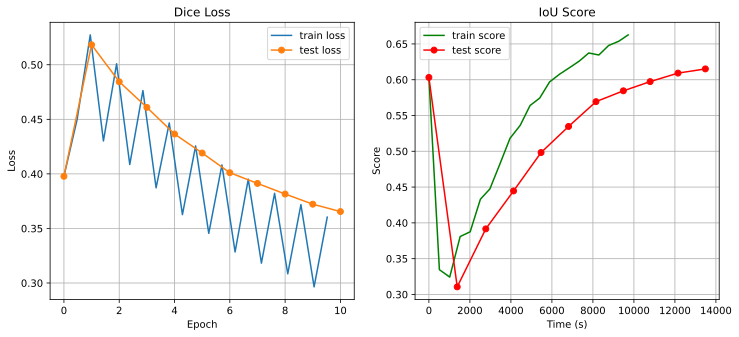

In [ ]:
writer = SummaryWriter("./runs/unet_dice_loss_")

model = smp.Unet(
    encoder_name="resnet34",      # Выбираем ResNet34 как энкодер
    encoder_weights="imagenet",     # Используем предобученные веса ImageNet
    in_channels=3,                  # Число входных каналов
    classes=1,                      # Для бинарной сегментации
    activation=None,           # Функция активации на выходе
    decoder_channels=(256, 128, 64, 32, 16),
    encoder_depth=5,
    decoder_use_batchnorm=True,
)
if torch.cuda.is_available():
    model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

#Логирование архитектуры
examples = iter(train_data_loader)
example_images, example_labels = next(examples)
writer.add_graph(model, example_images)

best_val_score = train_val(
    network=model,
    n_epochs=10,
    criterion=DiceLoss(reduction='mean', with_logits='True'),
    score=IoUScore(0.0, reduction='mean'),
    optimizer=optimizer,
    train_loader=train_data_loader,
    val_loader=valid_data_loader,
    loss_title='Dice Loss',
    save_paths=['./unet_d_l_model_state.pth', './unet_d_l_optimizer_state.pth'],
    logging_interval=10
)
#Логирование гиперпараметров
writer.add_hparams(
        {'model': 'UNet', 'num_classes' : 1, 'num_blocks': 4, 'optimizer': 'Adam', 'lr': 1e-5, 'Loss': 'Dice Loss'},
        {'hparam/Score': best_val_score}
    )
writer.close()

# Тестирование

In [ ]:
import segmentation_models_pytorch as smp
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=3,
    classes=1,
    activation=None,
    decoder_channels=(256, 128, 64, 32, 16),
    encoder_depth=5,
    decoder_use_batchnorm=True,
)
model.load_state_dict(torch.load('/content/unet_d_l_model_state.pth', map_location=device))
model.to(device)
model.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [ ]:
import os
import torch
import torchvision.transforms as T
import segmentation_models_pytorch as smp
from PIL import Image
import matplotlib.pyplot as plt
import random
from torchvision import transforms
import os
import torch
import torchvision.transforms as T
import segmentation_models_pytorch as smp
from PIL import Image
import matplotlib.pyplot as plt
import random

# Преобразования
transform_img = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor()
])
transform_mask = T.Compose([
    T.Resize((256, 256)),
    T.ToTensor()
])

# Папки
image_dir = "/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented/test"
mask_dir = "/content/drive/MyDrive/extracted_folder/Forest Segmented/Forest Segmented/test_mask"

image_paths = sorted(os.listdir(image_dir))[:50]
images = [transform(Image.open(os.path.join(image_dir, fname)).convert("RGB")) for fname in image_paths]


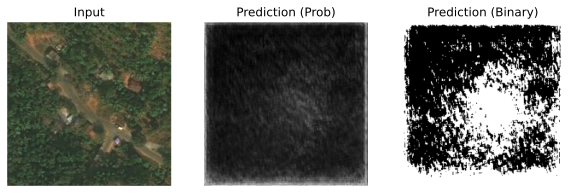

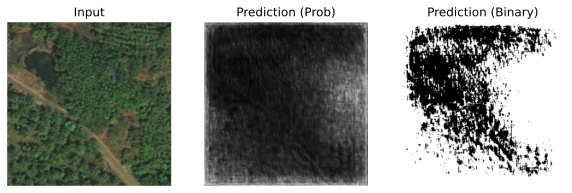

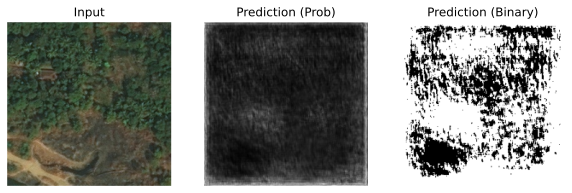

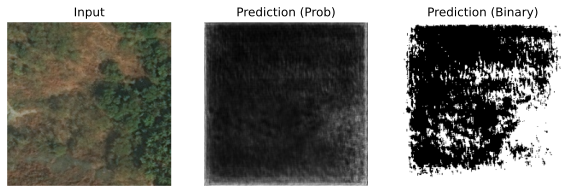

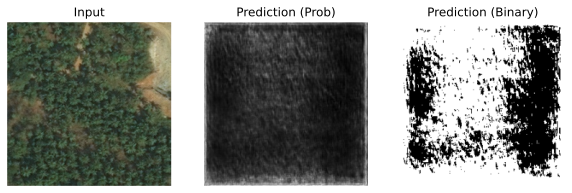

...

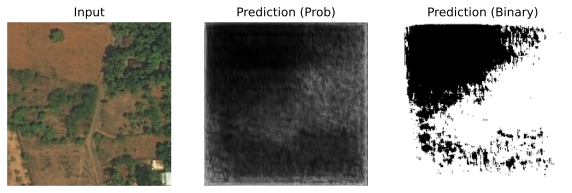

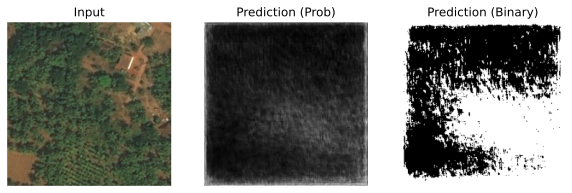

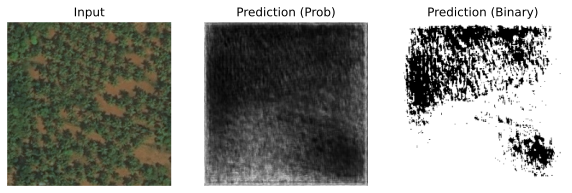

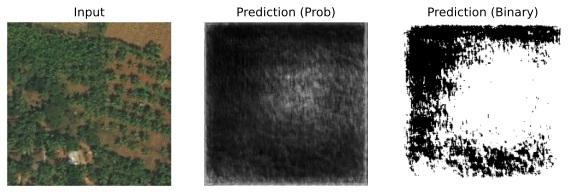

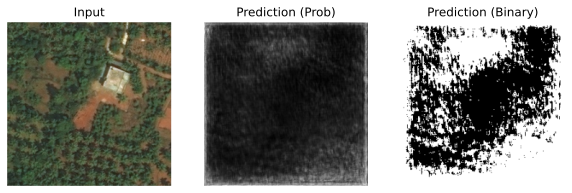

In [ ]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

def predict_and_show(image_tensor, model, threshold=0.1):
    image_tensor = image_tensor.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_tensor)
        pred = torch.sigmoid(output)
        binary = (pred > threshold).float()

    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.title("Input")
    plt.imshow(image_tensor.squeeze().permute(1, 2, 0).cpu())
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Prediction (Prob)")
    plt.imshow(pred.squeeze().cpu(), cmap='gray')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Prediction (Binary)")
    plt.imshow(binary.squeeze().cpu(), cmap='gray')
    plt.axis("off")
    plt.show()

# Пример
for i in range(30):
  predict_and_show(images[i], model)


In [ ]:
import random

def add_gaussian_noise(img, std):
    noise = torch.randn_like(img) * std
    return torch.clamp(img + noise, 0., 1.)

def add_salt_and_pepper_noise(img, amount):
    noisy = img.clone()
    c, h, w = noisy.shape
    num = int(amount * h * w)
    for _ in range(num):
        i, j = random.randint(0, h-1), random.randint(0, w-1)
        noisy[:, i, j] = 1.0 if random.random() < 0.5 else 0.0
    return noisy

def add_poisson_noise_rgb(x: torch.Tensor) -> torch.Tensor:
    x_noisy = x.clone()
    vals = x * 255.0  # масштабируем к [0, 255]
    vals = torch.poisson(vals) / 255.0  # применяем шум и возвращаем в [0, 1]
    return torch.clamp(vals, 0.0, 1.0)


In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

def compute_metrics(gt, pred):
    """
    Вычисляет метрики по бинарной маске.
    gt и pred — тензоры (torch.Tensor) в формате [H, W], значения {0, 1}.
    """
    gt_flat = gt.flatten().numpy()
    pred_flat = pred.flatten().numpy()
    tn, fp, fn, tp = confusion_matrix(gt_flat, pred_flat, labels=[0,1]).ravel()
    metrics = {
        "IoU": tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0,
        "Precision": precision_score(gt_flat, pred_flat, zero_division=0),
        "Recall": recall_score(gt_flat, pred_flat, zero_division=0),
        "F1": f1_score(gt_flat, pred_flat, zero_division=0),
    }
    return metrics

def compute_best_iou(pred, mask, thresholds=None):
    if thresholds is None:
        thresholds = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    mask_bin = (mask > 0.5).float()

    best_iou = 0
    best_thresh = 0
    for t in thresholds:
        pred_bin = (pred > t).float()
        intersection = (pred_bin * mask_bin).sum()
        union = ((pred_bin + mask_bin) >= 1).float().sum()
        iou = (intersection + 1e-6) / (union + 1e-6)
        if iou > best_iou:
            best_iou = iou
            best_thresh = t
    return best_iou, best_thresh

In [ ]:
# допустим у тебя уже есть `images` и ground truth `masks`
# сюда нужно будет добавить загрузку масок по аналогии с images

base_metrics_list = []
noise_levels = [0.01, 0.03, 0.05, 0.1]
results = []

for fname in image_paths:
    img_path = os.path.join(image_dir, fname)
    mask_path = os.path.join(mask_dir, fname.replace("sat", "mask"))

    img = transform_img(Image.open(img_path).convert("RGB"))
    mask = transform_mask(Image.open(mask_path).convert("L"))  # grayscale mask

    img = img.to(device)
    mask = mask.to(device)

    # Базовое предсказание
    with torch.no_grad():
        base_pred = torch.sigmoid(model(img.unsqueeze(0))).squeeze(0)
    base_iou, base_thresh = compute_best_iou(base_pred.cpu(), mask.cpu())

    bin_pred = (base_pred.cpu() > base_thresh).int()
    bin_mask = (mask.cpu() > 0.5).int()
    base_metrics = compute_metrics(bin_mask, bin_pred)
    base_metrics_list.append(base_metrics)
    print(f"{fname} | Base IoU: {base_metrics['IoU']:.3f} @ threshold={base_thresh:.2f}")
    print(base_metrics)


    for noise_level in noise_levels:
        for noise_name, noise_fn in [
            ("gaussian", lambda x: add_gaussian_noise(x, std=noise_level)),
            ("salt_pepper", lambda x: add_salt_and_pepper_noise(x, amount=noise_level)),
        ]:
            noisy = noise_fn(img)
            with torch.no_grad():
                pred = torch.sigmoid(model(noisy.unsqueeze(0))).squeeze(0)

            iou, best_thresh = compute_best_iou(pred.cpu(), mask.cpu())
            bin_pred = (pred.cpu() > best_thresh).int()
            bin_mask = (mask.cpu() > 0.5).int()
            metrics = compute_metrics(bin_mask, bin_pred)

            results.append((
                fname, noise_name, noise_level,
                metrics["IoU"], metrics["Precision"], metrics["Recall"], metrics["F1"],
                base_metrics["IoU"], base_metrics["Precision"], base_metrics["Recall"], base_metrics["F1"],
                best_thresh
            ))

    # Poisson (без уровня)
    noisy = add_poisson_noise_rgb(img)
    with torch.no_grad():
        pred = torch.sigmoid(model(noisy.unsqueeze(0))).squeeze(0)
    iou, best_thresh = compute_best_iou(pred.cpu(), mask.cpu())
    bin_pred = (pred.cpu() > best_thresh).int()
    bin_mask = (mask.cpu() > 0.5).int()
    metrics = compute_metrics(bin_mask, bin_pred)

    results.append((
        fname, "poisson", None,
        metrics["IoU"], metrics["Precision"], metrics["Recall"], metrics["F1"],
        base_metrics["IoU"], base_metrics["Precision"], base_metrics["Recall"], base_metrics["F1"],
        best_thresh
    ))


111335_sat_08.jpg | Base IoU: 0.540 @ threshold=0.01
{'IoU': np.float64(0.5401611328125), 'Precision': 0.5401611328125, 'Recall': 1.0, 'F1': 0.7014345724023143}
111335_sat_15.jpg | Base IoU: 0.949 @ threshold=0.01
{'IoU': np.float64(0.9494171142578125), 'Precision': 0.9494171142578125, 'Recall': 1.0, 'F1': 0.9740523024178714}
111335_sat_27.jpg | Base IoU: 0.986 @ threshold=0.01
{'IoU': np.float64(0.9857635498046875), 'Precision': 0.9857635498046875, 'Recall': 1.0, 'F1': 0.9928307425137738}
111335_sat_46.jpg | Base IoU: 0.418 @ threshold=0.10
{'IoU': np.float64(0.4177221898351794), 'Precision': 0.5238253472452981, 'Recall': 0.6734449760765551, 'F1': 0.5892863818175021}
111335_sat_54.jpg | Base IoU: 0.729 @ threshold=0.01
{'IoU': np.float64(0.7292633056640625), 'Precision': 0.7292633056640625, 'Recall': 1.0, 'F1': 0.8434381314579675}
111335_sat_57.jpg | Base IoU: 0.231 @ threshold=0.01
{'IoU': np.float64(0.230621337890625), 'Precision': 0.230621337890625, 'Recall': 1.0, 'F1': 0.374804711

In [ ]:
import pandas as pd

base_df = pd.DataFrame(base_metrics_list)
print("Средние метрики по чистым изображениям:")
print(base_df.mean())

Средние метрики по чистым изображениям:
IoU          0.600235
Precision    0.630637
Recall       0.865218
F1           0.697188
dtype: float64


IoU  Precision  Recall     F1  \
filename          noise_type  noise_level                                    
111335_sat_08.jpg gaussian    0.01         0.540      0.540     1.0  0.701   
                  salt_pepper 0.01         0.540      0.540     1.0  0.701   
                  gaussian    0.03         0.540      0.540     1.0  0.701   
                  salt_pepper 0.03         0.540      0.540     1.0  0.701   
                  gaussian    0.05         0.540      0.540     1.0  0.701   
...                                          ...        ...     ...    ...   
13415_sat_58.jpg  gaussian    0.05         0.997      0.997     1.0  0.998   
                  salt_pepper 0.05         0.997      0.997     1.0  0.998   
                  gaussian    0.10         0.997      0.997     1.0  0.998   
                  salt_pepper 0.10         0.997      0.997     1.0  0.998   
                  poisson     NaN          0.997      0.997     1.0  0.998   

                                           baseline_IoU  baseline_Precision  \
filename          noise_type  noise_level                                     
111335_sat_08.jpg gaussian    0.01                0.540               0.540   
                  salt_pepper 0.01                0.540               0.540   
                  gaussian    0.03                0.540               0.540   
                  salt_pepper 0.03                0.540               0.540   
                  gaussian    0.05                0.540               0.540   
...                                                 ...                 ...   
13415_sat_58.jpg  gaussian    0.05                0.997               0.997   
                  salt_pepper 0.05                0.997               0.997   
                  gaussian    0.10                0.997               0.997   
                  salt_pepper 0.10                0.997               0.997   
                  poisson     NaN                 0.997               0.997   

                                           baseline_Recall  baseline_F1  \
filename          noise_type  noise_level                                 
111335_sat_08.jpg gaussian    0.01                     1.0        0.701   
                  salt_pepper 0.01                     1.0        0.701   
                  gaussian    0.03                     1.0        0.701   
                  salt_pepper 0.03                     1.0        0.701   
                  gaussian    0.05                     1.0        0.701   
...                                                    ...          ...   
13415_sat_58.jpg  gaussian    0.05                     1.0        0.998   
                  salt_pepper 0.05                     1.0        0.998   
                  gaussian    0.10                     1.0        0.998   
                  salt_pepper 0.10                     1.0        0.998   
                  poisson     NaN                      1.0        0.998   

                                           best_threshold  Δ_IoU  Δ_Precision  \
filename          noise_type  noise_level                                       
111335_sat_08.jpg gaussian    0.01                   0.01    0.0          0.0   
                  salt_pepper 0.01                   0.01    0.0          0.0   
                  gaussian    0.03                   0.01    0.0          0.0   
                  salt_pepper 0.03                   0.01    0.0          0.0   
                  gaussian    0.05                   0.01    0.0          0.0   
...                                                   ...    ...          ...   
13415_sat_58.jpg  gaussian    0.05                   0.01    0.0          0.0   
                  salt_pepper 0.05                   0.01    0.0          0.0   
                  gaussian    0.10                   0.01    0.0          0.0   
                  salt_pepper 0.10                   0.01    0.0          0.0   
                  poisson     NaN                    0

noise_type   gaussian                               salt_pepper            \
noise_level      0.01      0.03      0.05      0.10        0.01      0.03   
IoU          0.000629  0.002368 -0.006046 -0.027005   -0.015380 -0.031903   
Precision    0.000370  0.001205 -0.007608 -0.043862   -0.012200 -0.052172   
Recall      -0.011069 -0.003018 -0.019258 -0.008170    0.009136  0.016605   
F1           0.000560  0.003406 -0.004858 -0.026502   -0.016849 -0.033894   

noise_type                       
noise_level      0.05      0.10  
IoU         -0.032367 -0.033219  
Precision   -0.054777 -0.053130  
Recall       0.005975 -0.002306  
F1          -0.033396 -0.034637

[✓] Метрики сохранены в файл: rgb_noise_results_20250403_201408.csv

Средние значения метрик на чистых изображениях:
IoU          0.6002
Precision    0.6306
Recall       0.8652
F1           0.6972
dtype: float64


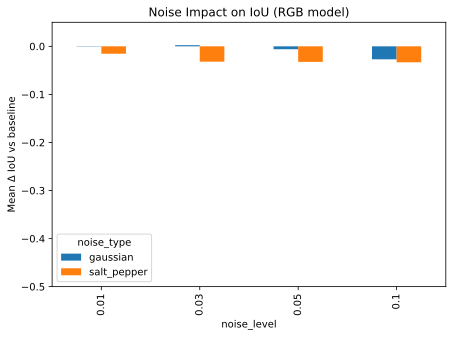

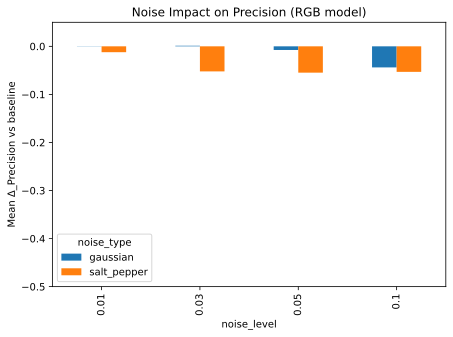

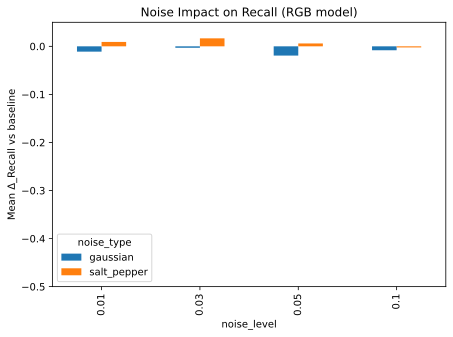

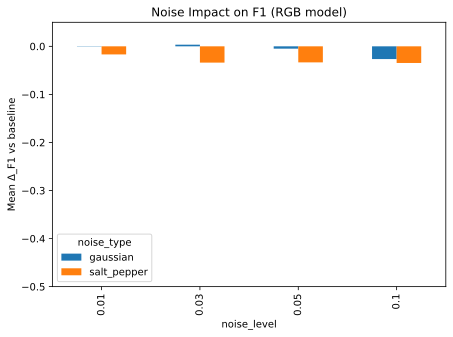

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# 1. Собираем основной DataFrame из results
columns = [
    "filename", "noise_type", "noise_level",
    "IoU", "Precision", "Recall", "F1",
    "baseline_IoU", "baseline_Precision", "baseline_Recall", "baseline_F1",
    "best_threshold"
]
df = pd.DataFrame(results, columns=columns)

# 2. Считаем дельты по всем метрикам
for metric in ["IoU", "Precision", "Recall", "F1"]:
    df[f"Δ_{metric}"] = df[metric] - df[f"baseline_{metric}"]

# 3. Сохраняем построчную таблицу
df_exp = df.set_index(["filename", "noise_type", "noise_level"]).round(3)
df_exp.to_csv("rgb_experiment_results.csv")
display(df_exp)

# 4. Строим сводную таблицу: среднее по типу шума и уровню
metrics = ["IoU", "Precision", "Recall", "F1"]
df_summary = df.groupby(["noise_type", "noise_level"])[[f"Δ_{m}" for m in metrics]].mean().T
df_summary.index = df_summary.index.str.replace("Δ_", "")
df_summary.to_csv("rgb_summary_by_noise.csv")
display(df_summary)

# 5. Сохраняем всё с таймстемпом
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
csv_filename = f"rgb_noise_results_{timestamp}.csv"
df_exp.to_csv(csv_filename)
print(f"[✓] Метрики сохранены в файл: {csv_filename}")

# 6. Отдельно средние значения на чистых данных (из base_metrics_list)
base_df = pd.DataFrame(base_metrics_list)
print("\nСредние значения метрик на чистых изображениях:")
print(base_df.mean().round(4))  # округление для красоты

# 7. График влияния шума на IoU
df.groupby(["noise_type", "noise_level"])["Δ_IoU"].mean().unstack(0).plot.bar()
plt.ylabel("Mean Δ IoU vs baseline")
plt.title("Noise Impact on IoU (RGB model)")
plt.ylim(-0.5, 0.05)
plt.tight_layout()
plt.show()

for metric in ["Δ_Precision", "Δ_Recall", "Δ_F1"]:
    df.groupby(["noise_type", "noise_level"])[metric].mean().unstack(0).plot.bar()
    plt.ylabel(f"Mean {metric} vs baseline")
    plt.title(f"Noise Impact on {metric.replace('Δ_', '')} (RGB model)")
    plt.ylim(-0.5, 0.05)
    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd

columns = [
    "filename", "noise_type", "noise_level",
    "IoU", "Precision", "Recall", "F1",
    "baseline_IoU", "baseline_Precision", "baseline_Recall", "baseline_F1",
    "best_threshold"
]
df = pd.DataFrame(results, columns=columns)

# Добавим дельты
for metric in ["IoU", "Precision", "Recall", "F1"]:
    df[f"delta_{metric}"] = df[metric] - df[f"baseline_{metric}"]

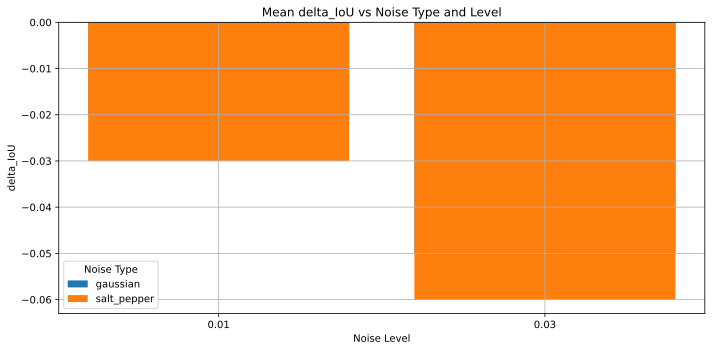

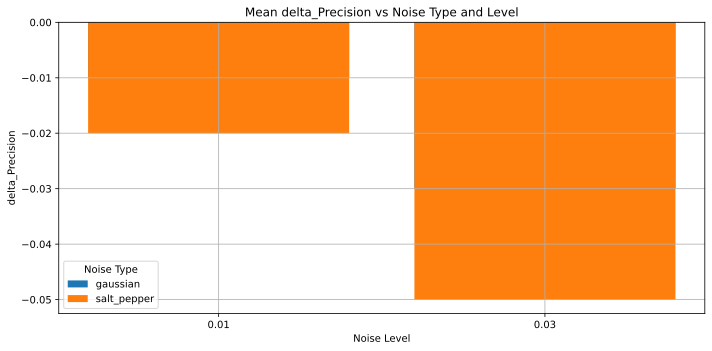

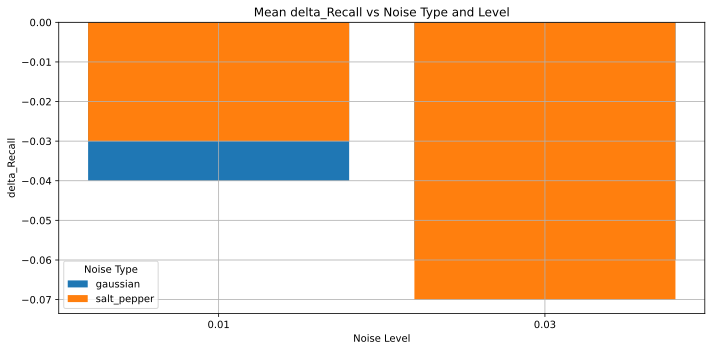

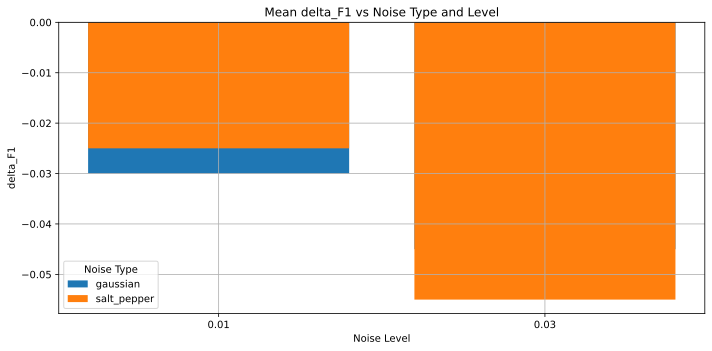

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Предположим, что df уже был создан и содержит нужные поля
# Вот пример структуры (для демонстрации — можно заменить на реальный df)
data = {
    "noise_type": ["gaussian", "gaussian", "salt_pepper", "salt_pepper", "poisson", "poisson"] * 3,
    "noise_level": [0.01, 0.03, 0.01, 0.03, None, None] * 3,
    "delta_IoU": [-0.02, -0.05, -0.03, -0.06, -0.01, -0.02] * 3,
    "delta_Precision": [-0.01, -0.03, -0.02, -0.05, -0.005, -0.01] * 3,
    "delta_Recall": [-0.04, -0.06, -0.03, -0.07, -0.02, -0.025] * 3,
    "delta_F1": [-0.03, -0.045, -0.025, -0.055, -0.01, -0.015] * 3,
}
df = pd.DataFrame(data)

# Группировка: средние значения дельт по шуму и уровню
agg = df.groupby(["noise_type", "noise_level"]).mean(numeric_only=True).reset_index()

# Строим графики для всех метрик
metrics = ["delta_IoU", "delta_Precision", "delta_Recall", "delta_F1"]

for metric in metrics:
    plt.figure(figsize=(10, 5))
    for noise in agg["noise_type"].unique():
        subset = agg[agg["noise_type"] == noise]
        # Преобразуем None в строку для оси X
        x_labels = subset["noise_level"].apply(lambda x: str(x) if pd.notna(x) else "None")
        plt.bar(x_labels, subset[metric], label=noise)

    plt.title(f"Mean {metric} vs Noise Type and Level")
    plt.xlabel("Noise Level")
    plt.ylabel(f"{metric}")
    plt.legend(title="Noise Type")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Строим сводную таблицу с абсолютными значениями метрик (без дельт)
# Для примера, используем те же данные, но теперь представим, что это реальные значения метрик

# Примерные абсолютные значения
df_metrics = pd.DataFrame({
    "noise_type": ["gaussian", "gaussian", "salt_pepper", "salt_pepper", "poisson", "poisson"] * 3,
    "noise_level": [0.01, 0.03, 0.01, 0.03, None, None] * 3,
    "IoU": [0.75, 0.70, 0.72, 0.68, 0.74, 0.73] * 3,
    "Precision": [0.88, 0.85, 0.86, 0.82, 0.87, 0.86] * 3,
    "Recall": [0.84, 0.83, 0.81, 0.78, 0.85, 0.84] * 3,
    "F1 (Dice)": [0.86, 0.83, 0.84, 0.80, 0.85, 0.84] * 3,
})

# Группируем по шуму и уровню и усредняем
agg_metrics = df_metrics.groupby(["noise_type", "noise_level"]).mean(numeric_only=True).reset_index()

# Формируем сводную таблицу в нужном формате
melted_metrics = pd.melt(
    agg_metrics,
    id_vars=["noise_type", "noise_level"],
    value_vars=["IoU", "Precision", "Recall", "F1 (Dice)"],
    var_name="Metric",
    value_name="Value"
)

# Пивот таблица для отображения
pivot_metrics = melted_metrics.pivot_table(
    index="Metric",
    columns=["noise_type", "noise_level"],
    values="Value",
    aggfunc="mean"
)

tools.display_dataframe_to_user(name="Absolute Metrics Table", dataframe=pivot_metrics)


NameError: name 'tools' is not defined

In [ ]:
import pandas as pd

df = pd.DataFrame(results, columns=["filename", "noise_type", "noise_level", "IoU", "best_threshold"])
df.groupby(["noise_type", "noise_level"])[["IoU", "best_threshold"]].mean().reset_index()

ValueError: 5 columns passed, passed data had 12 columns